In [1]:
!unrar x /content/dataset_Real_photo.rar dataset/ -y
!pip install ultralytics


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/dataset_Real_photo.rar

Extracting  dataset/photo_1_2025-10-29_19-54-43.jpg                        3%  OK 
Extracting  dataset/photo_2_2025-10-29_19-54-43.jpg                        6%  OK 
Extracting  dataset/photo_3_2025-10-29_19-54-43.jpg                        9%  OK 
Extracting  dataset/photo_4_2025-10-29_19-54-43.jpg                       10%  OK 
Extracting  dataset/photo_5_2025-10-29_19-54-43.jpg                       11%  OK 
Extracting  dataset/photo_6_2025-10-29_19-54-43.jpg                       12%  OK 
Extracting  dataset/photo_7_2025-10-29_19-54-43.jpg                       14%  OK 
Extracting  dataset/photo_8_2025-10-29_19-54-43.jpg                       17%  OK 
Extracting  dataset/photo_9_2025-10-29_19-54-43.jpg                       19%  OK 
Extracting  dataset/photo_10_2025-10-29_19-54-4

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from PIL import Image

# Preprocessing

файлы для тестирования
1. /content/dataset/photo_40_2025-10-29_19-54-43.jpg
2. /content/dataset/photo_18_2025-10-29_19-54-43.jpg
3. /content/dataset/photo_20_2025-10-29_19-54-43.jpg
4. /content/dataset/photo_15_2025-10-29_19-54-43.jpg
5. /content/dataset/photo_42_2025-10-29_19-54-43.jpg
6. /content/dataset/photo_46_2025-10-29_19-54-43.jpg
7. /content/dataset/photo_25_2025-10-29_19-54-43.jpg
8. /content/dataset/photo_16_2025-10-29_19-54-43.jpg
9. /content/dataset/photo_26_2025-10-29_19-54-43.jpg
10. /content/dataset/photo_1_2025-10-29_19-54-43.jpg


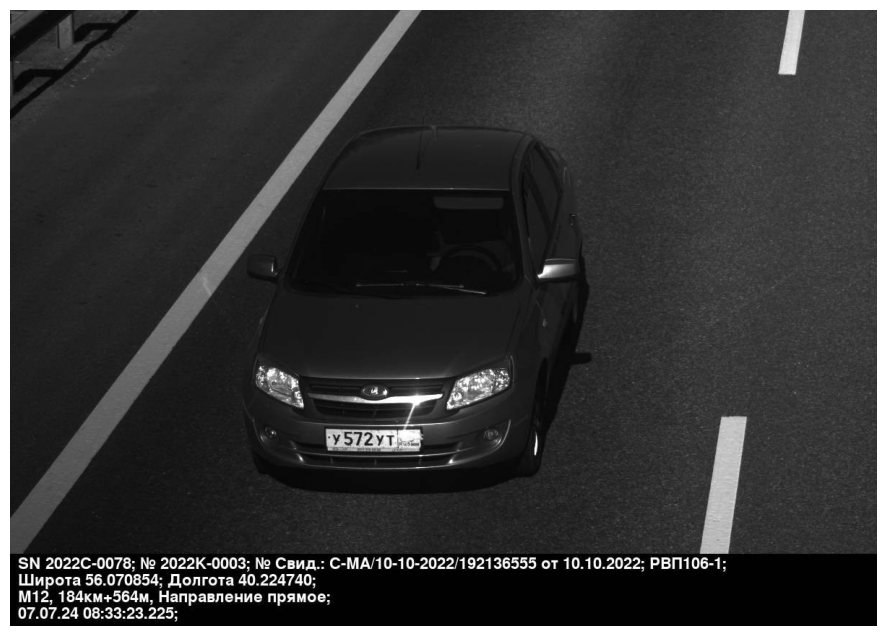

In [51]:
image_files = []
for root, dirs, files in os.walk('/content/dataset'):
    for file in files:
        if file.lower().endswith('.jpg'):
            image_files.append(os.path.join(root, file))

selected_files = random.sample(image_files, min(10, len(image_files)))
print("файлы для тестирования")
for i, file in enumerate(selected_files):
    print(f"{i+1}. {file}")

for file in selected_files:
    img = cv2.imread(file)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(12, 8))
    plt.imshow(img_rgb)
    plt.axis('off')
    break

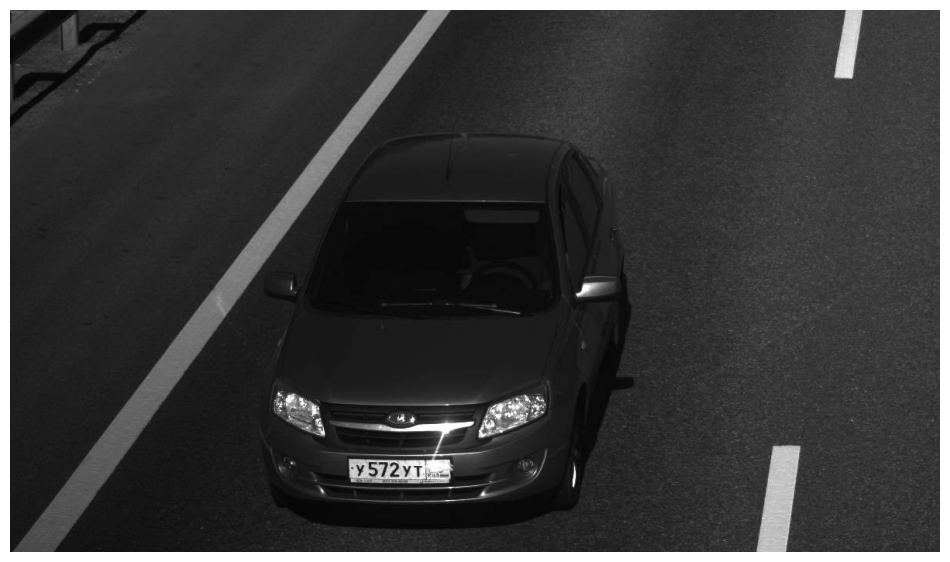

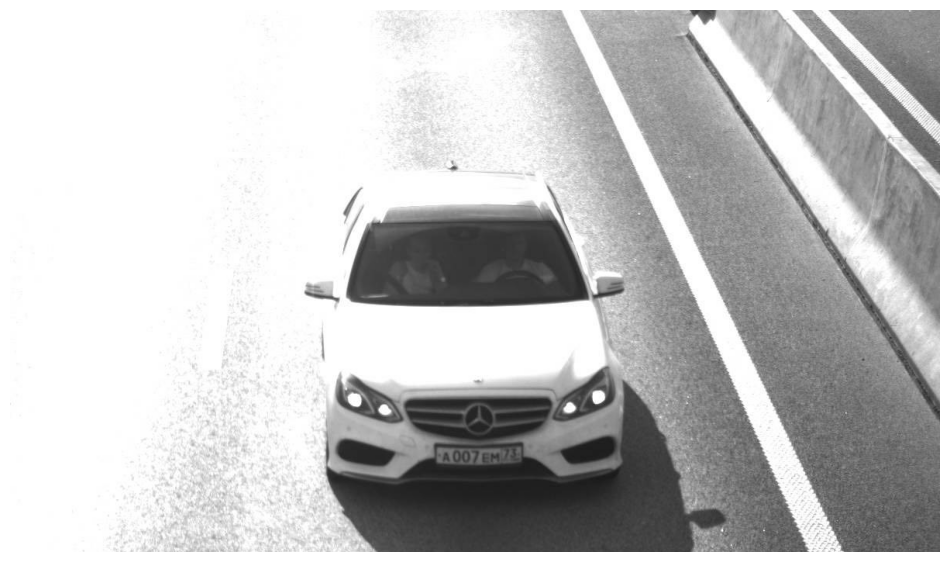

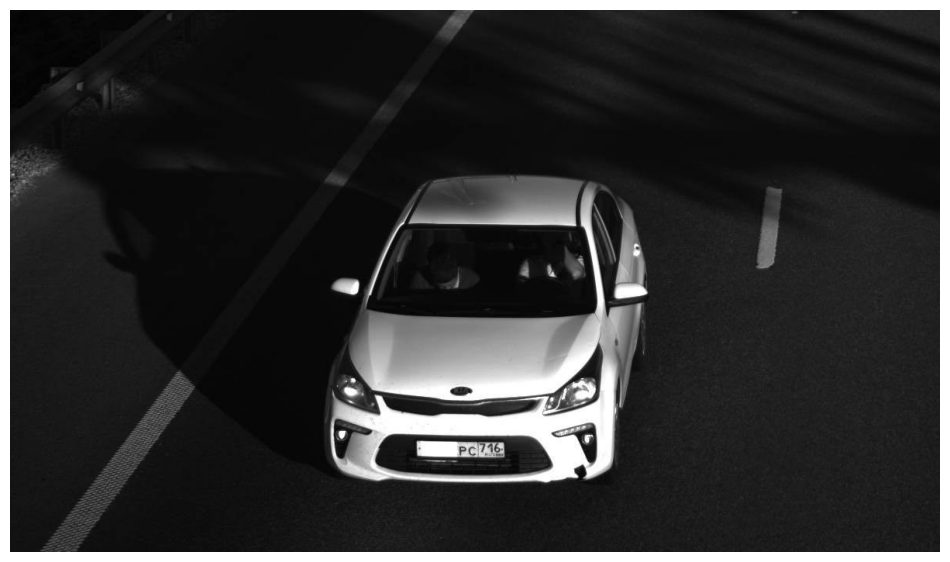

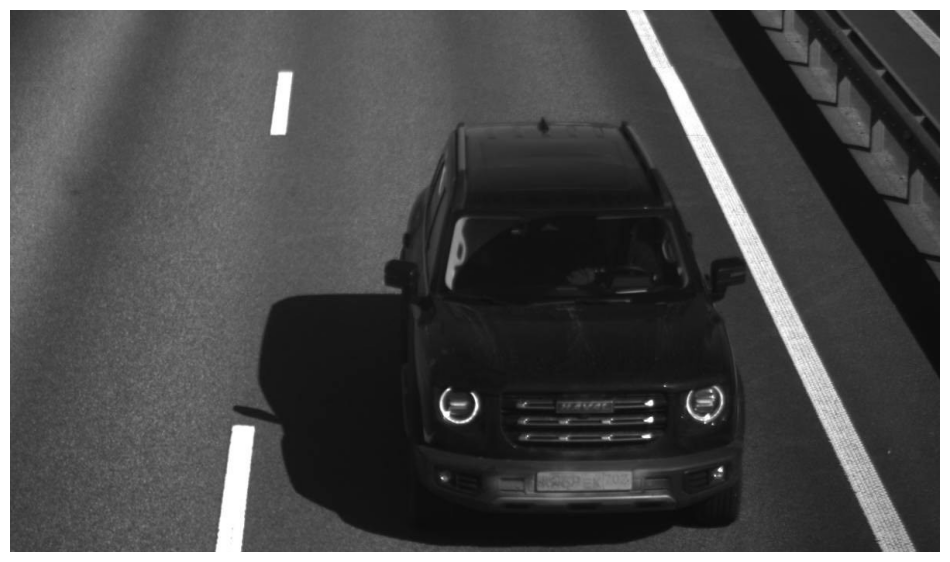

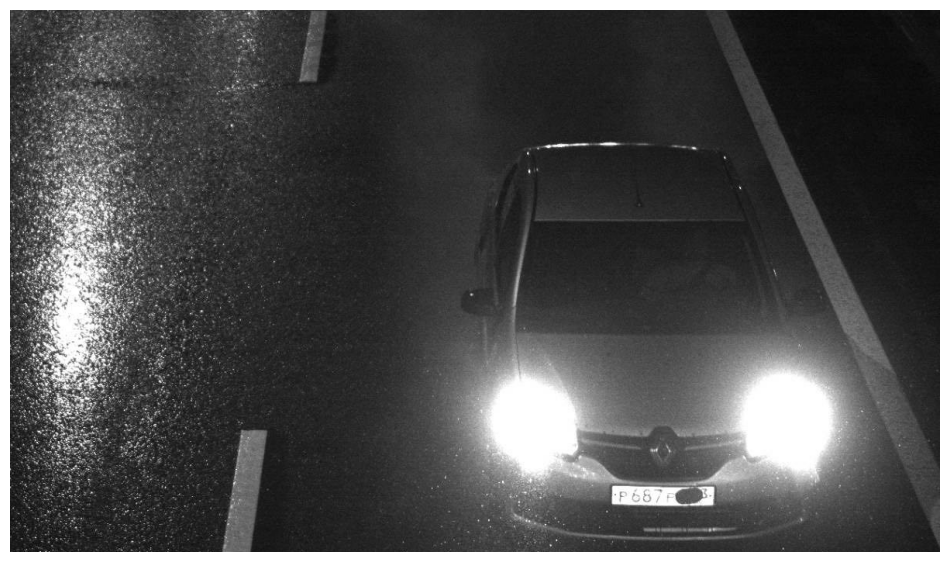

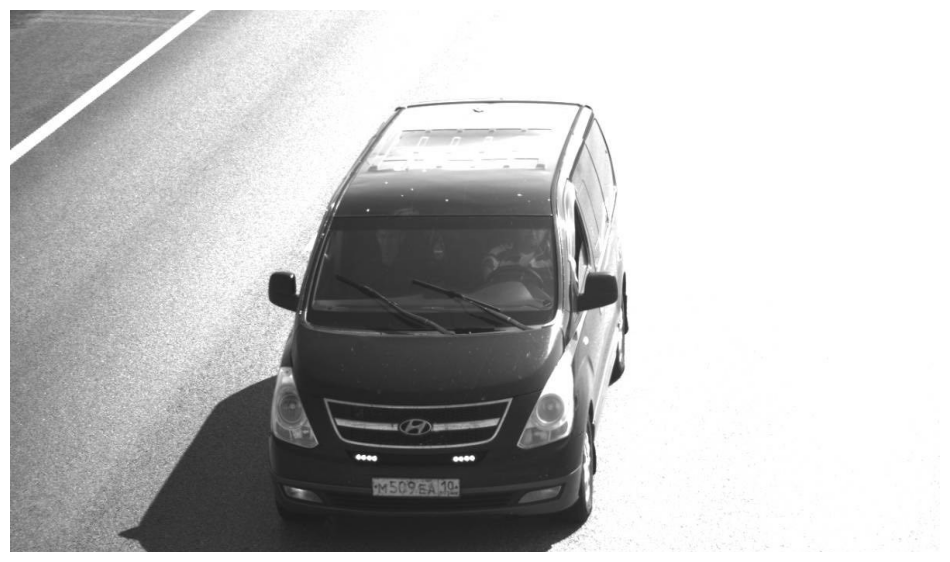

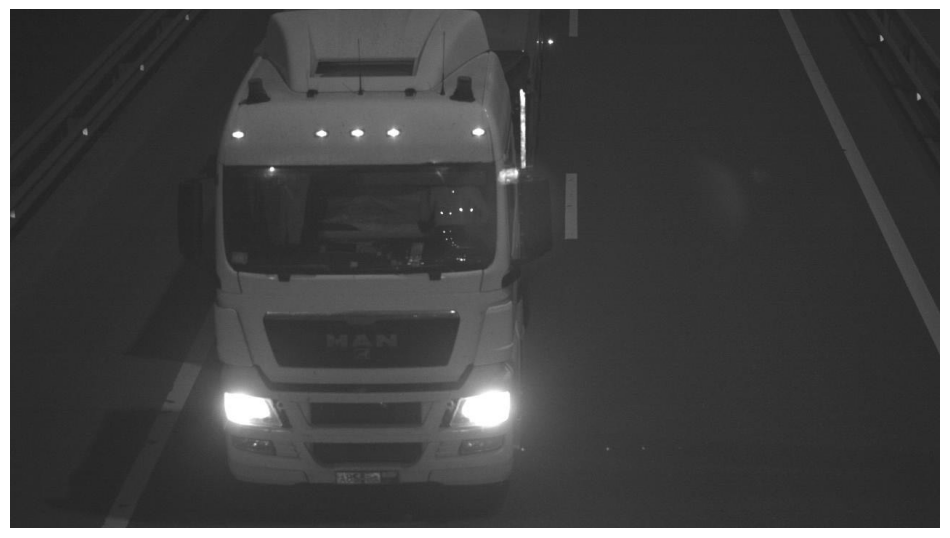

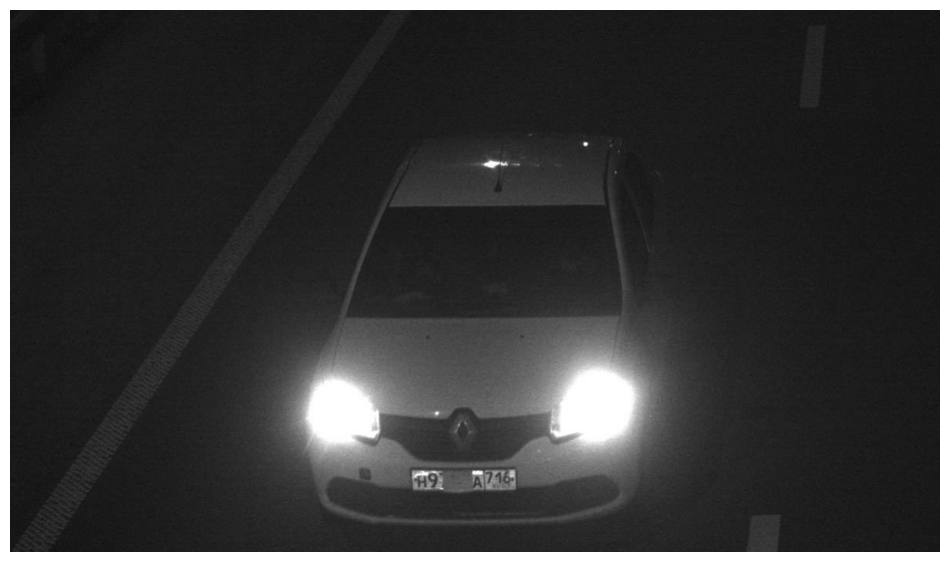

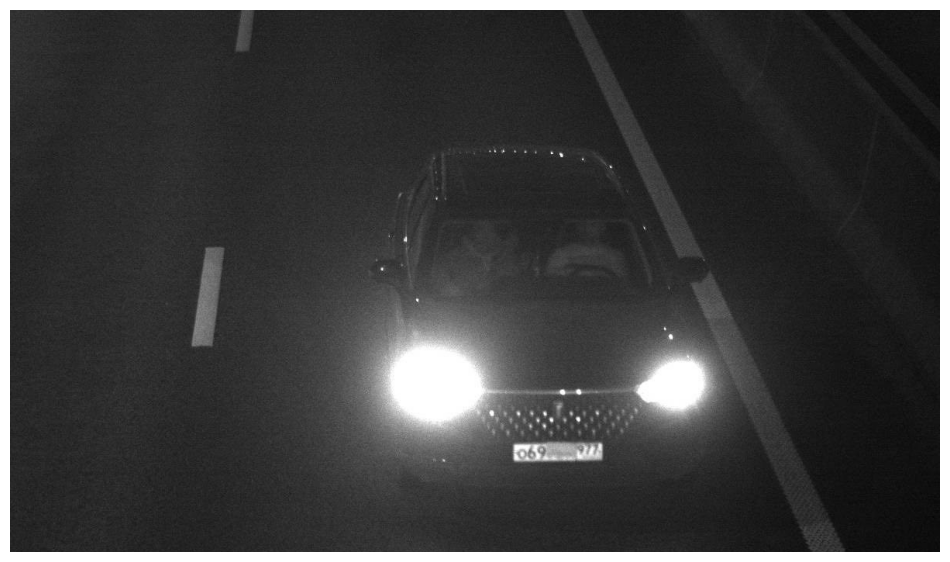

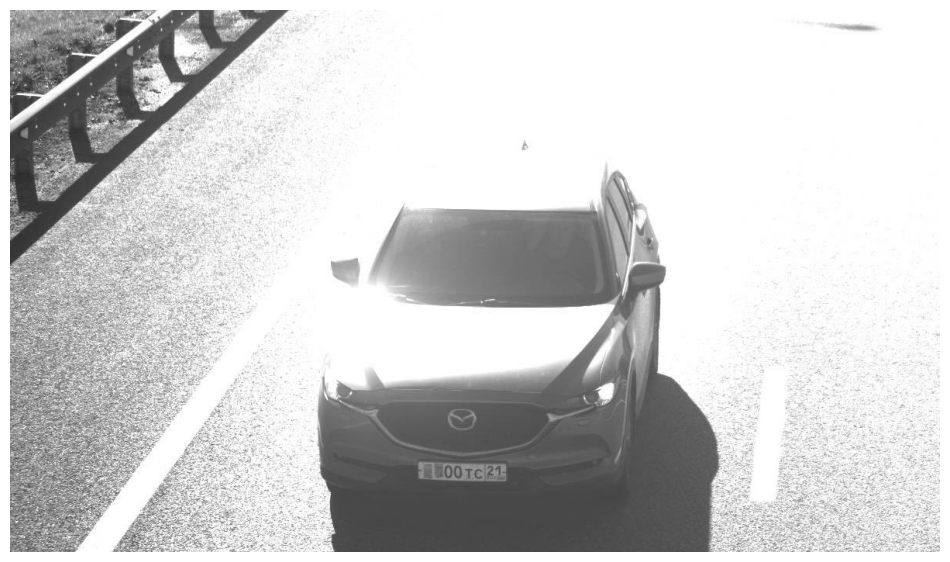

In [52]:
test_images = []
for file in selected_files:
    img = cv2.imread(file)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    height = img_rgb.shape[0]
    cut_height = int(height * 0.18)
    img_cropped = img_rgb[:-cut_height, :]
    plt.figure(figsize=(12, 8))
    plt.imshow(img_cropped)
    plt.axis('off')
    test_images.append(img_cropped)

# Haar cascade

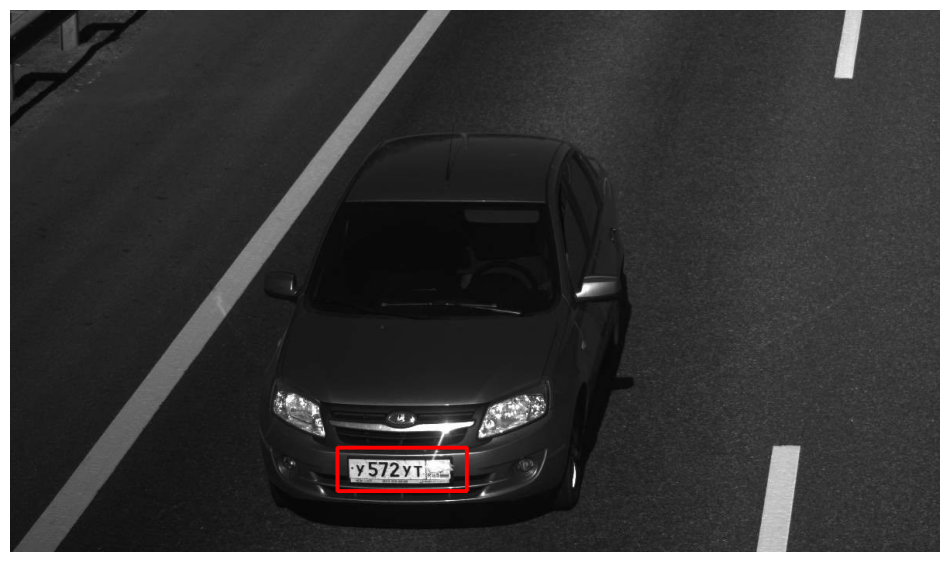

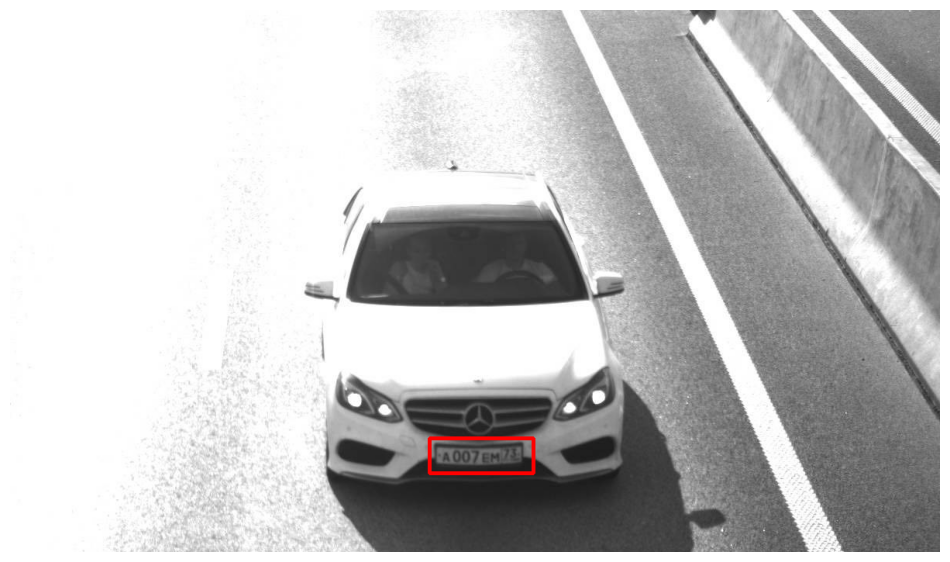

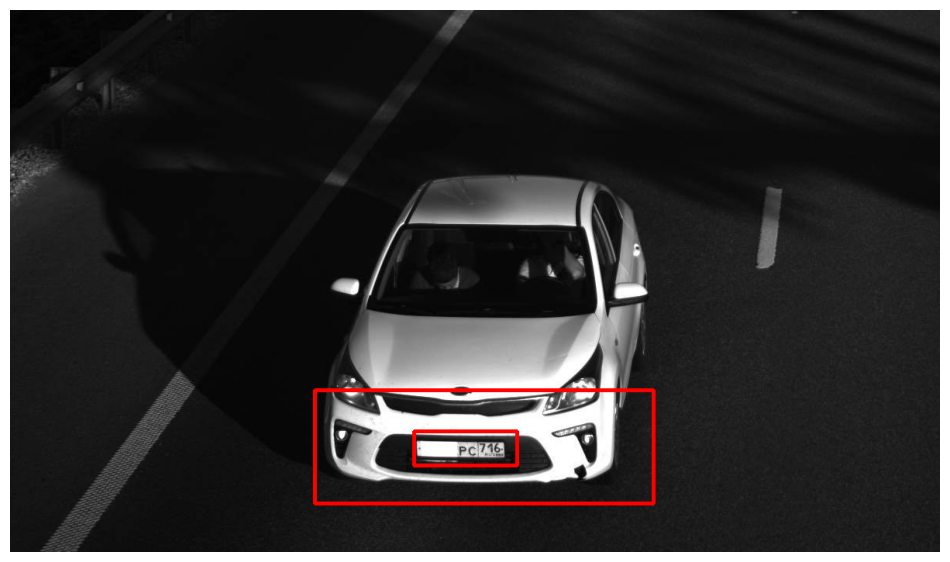

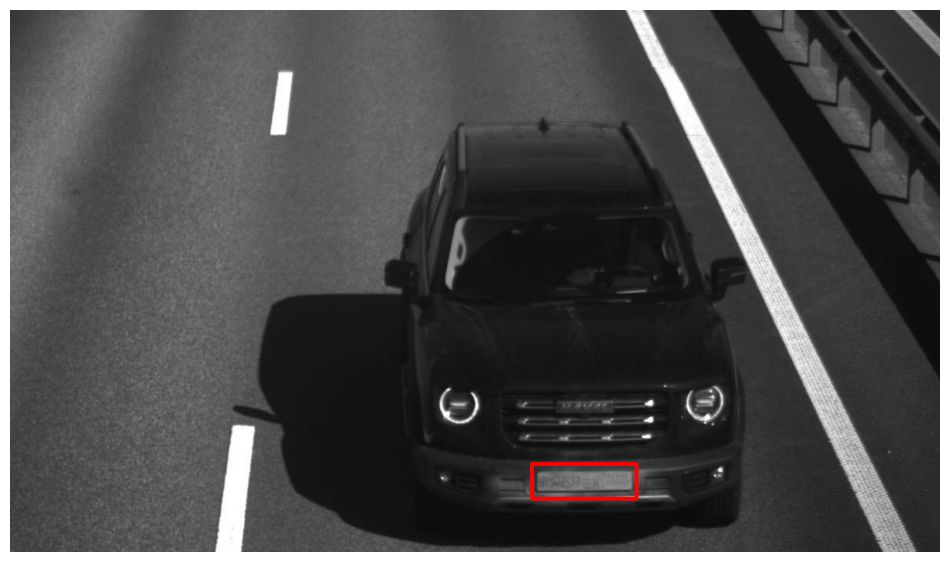

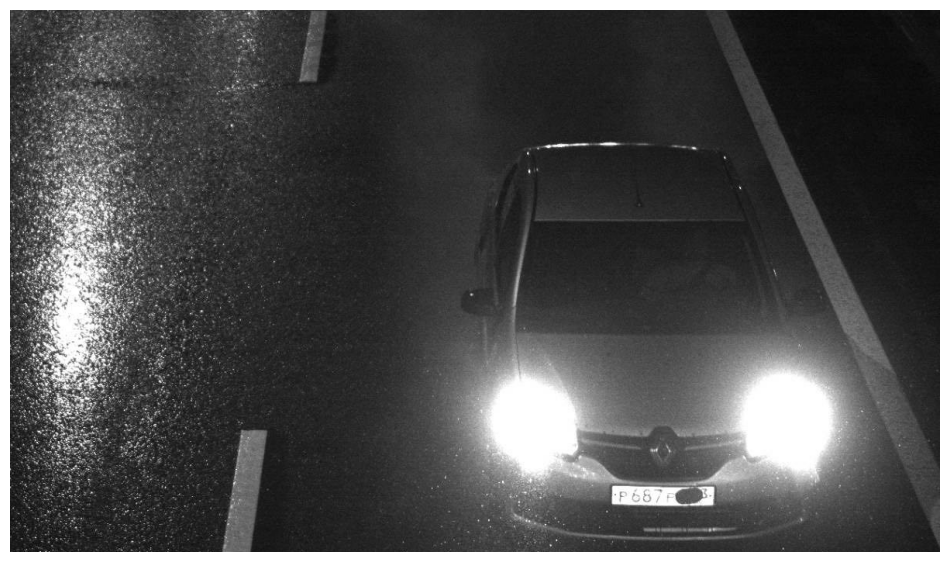

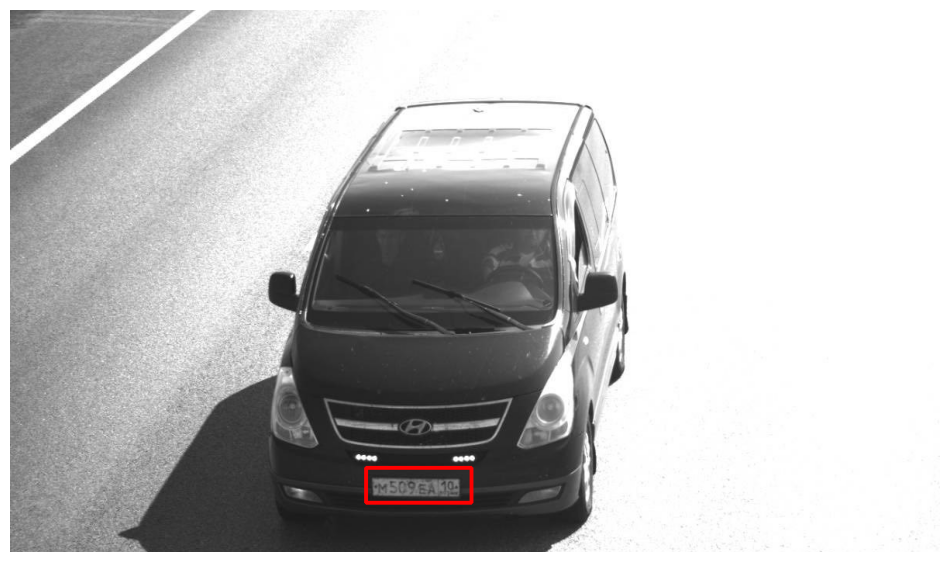

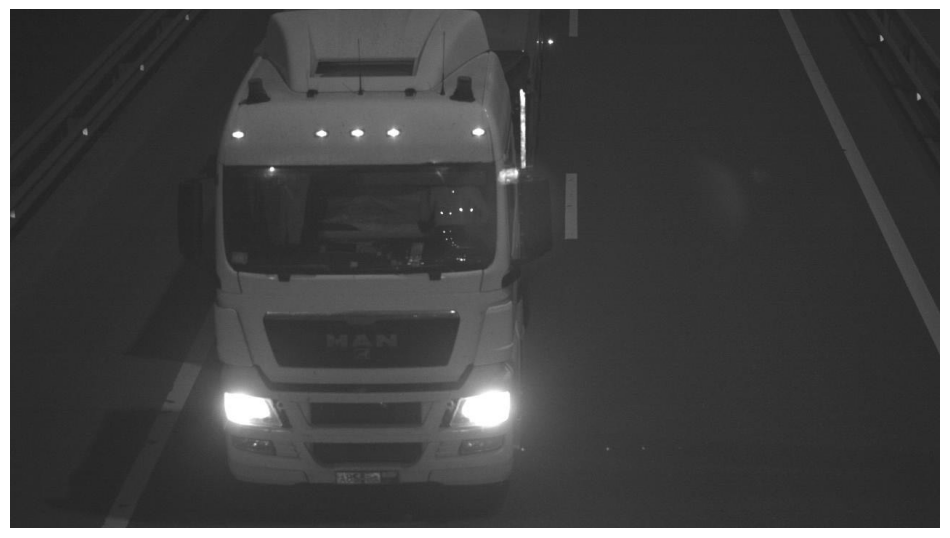

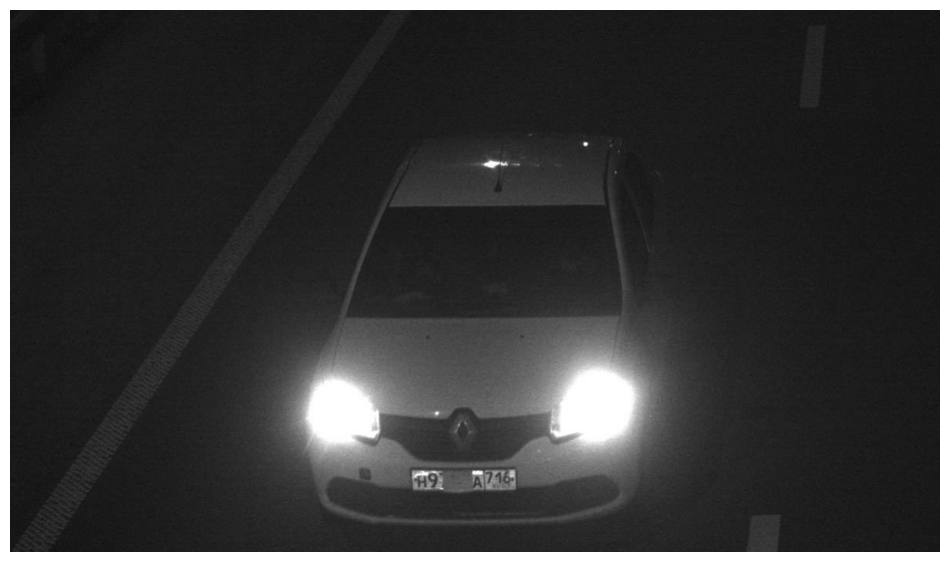

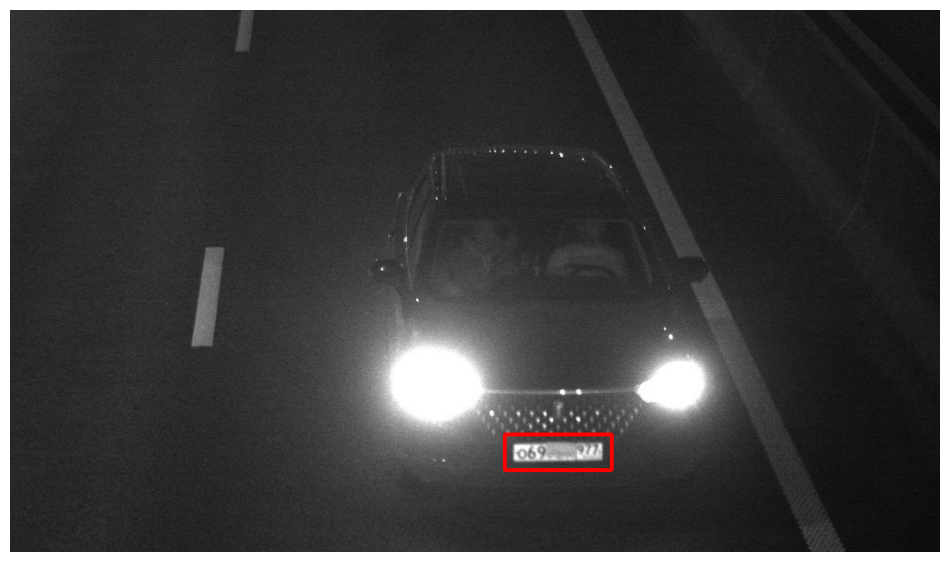

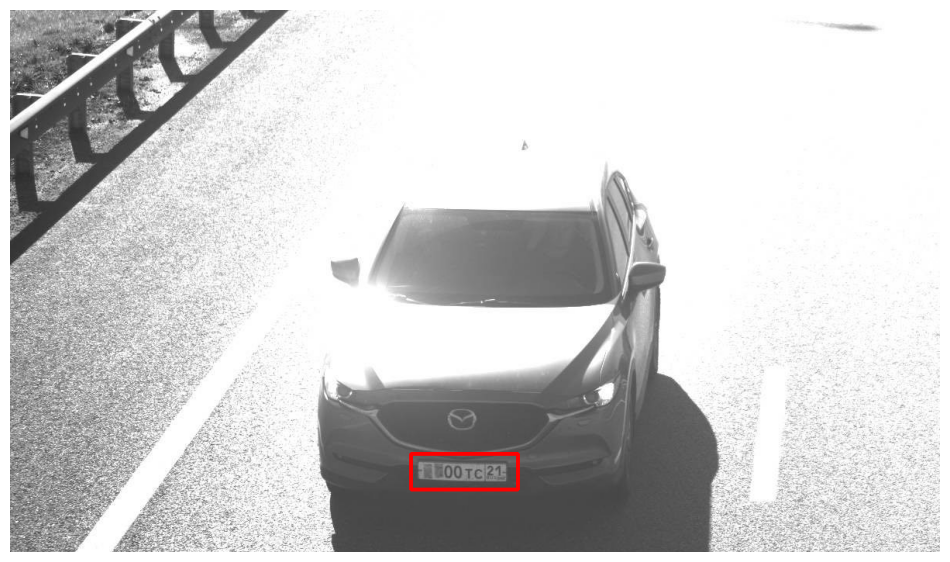

In [53]:
plate_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_russian_plate_number.xml')


for i, img in enumerate(test_images):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    plates = plate_cascade.detectMultiScale(gray, 1.1, 4)

    result_img = img.copy()
    for (x, y, w, h) in plates:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (255, 0, 0), 3)
        cv2.putText(result_img, '', (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)

    plt.figure(figsize=(12, 8))
    plt.imshow(result_img)
    plt.axis('off')
    plt.show()

# Yolo v11
Модель была взята с соревнования Car License Plate Detection на kaggle

In [48]:
import ultralytics
ultralytics.checks()
from ultralytics import YOLO

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.2/107.7 GB disk)


In [49]:
model=YOLO('best.pt')


0: 384x640 1 number_plate, 234.8ms
Speed: 11.5ms preprocess, 234.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


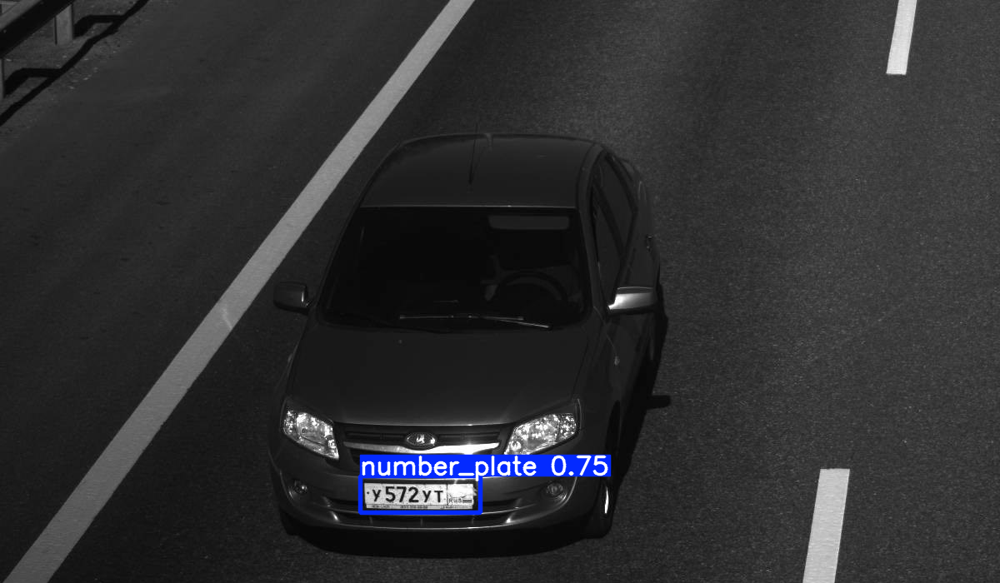


0: 384x640 1 number_plate, 230.3ms
Speed: 10.0ms preprocess, 230.3ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)


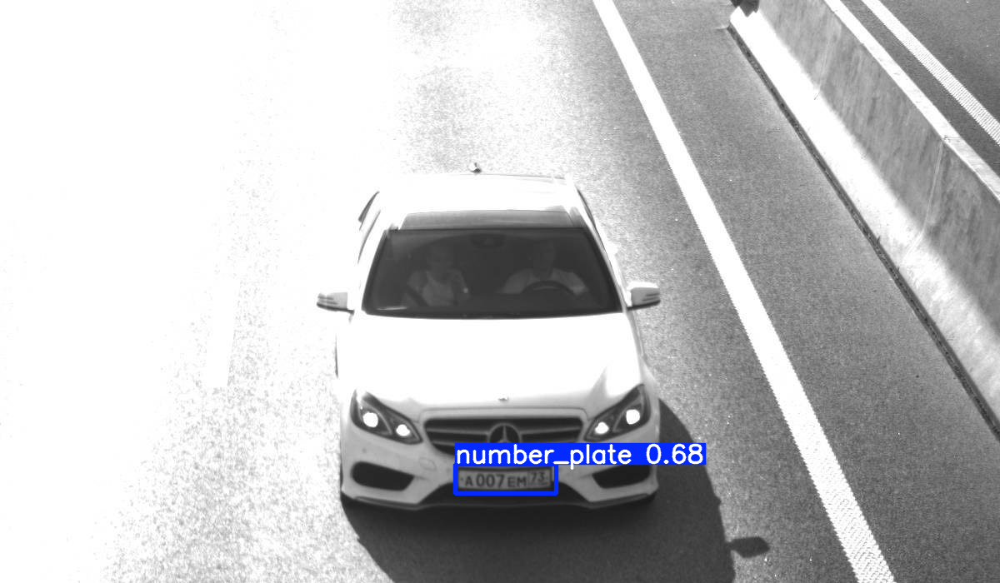


0: 384x640 2 number_plates, 212.3ms
Speed: 6.2ms preprocess, 212.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


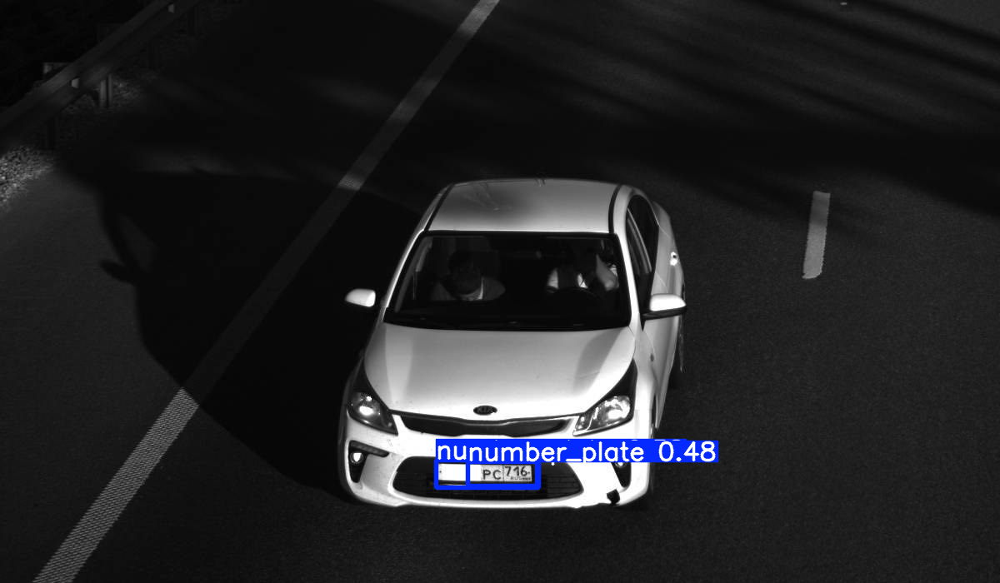


0: 384x640 1 number_plate, 233.7ms
Speed: 8.3ms preprocess, 233.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


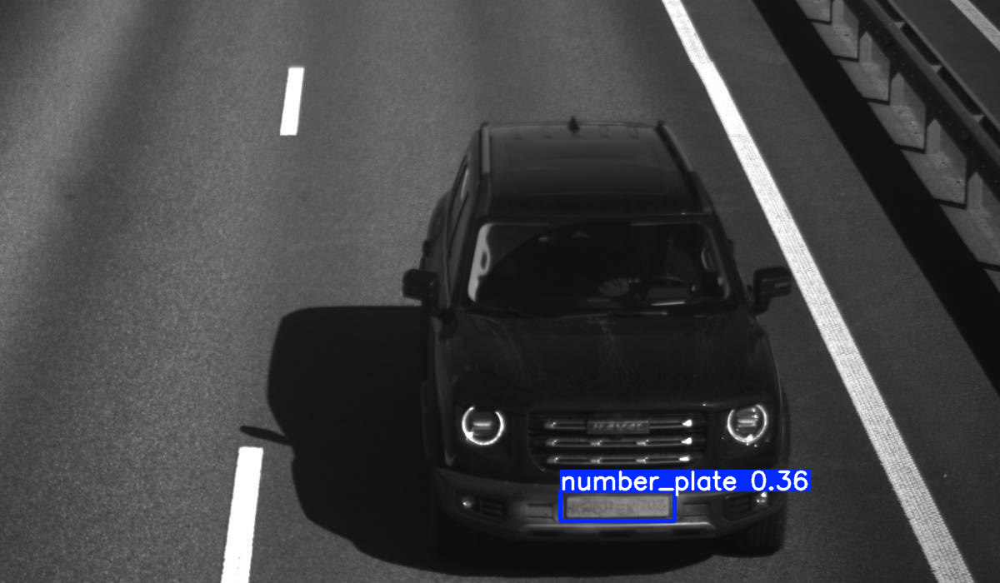


0: 384x640 1 number_plate, 233.6ms
Speed: 7.1ms preprocess, 233.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


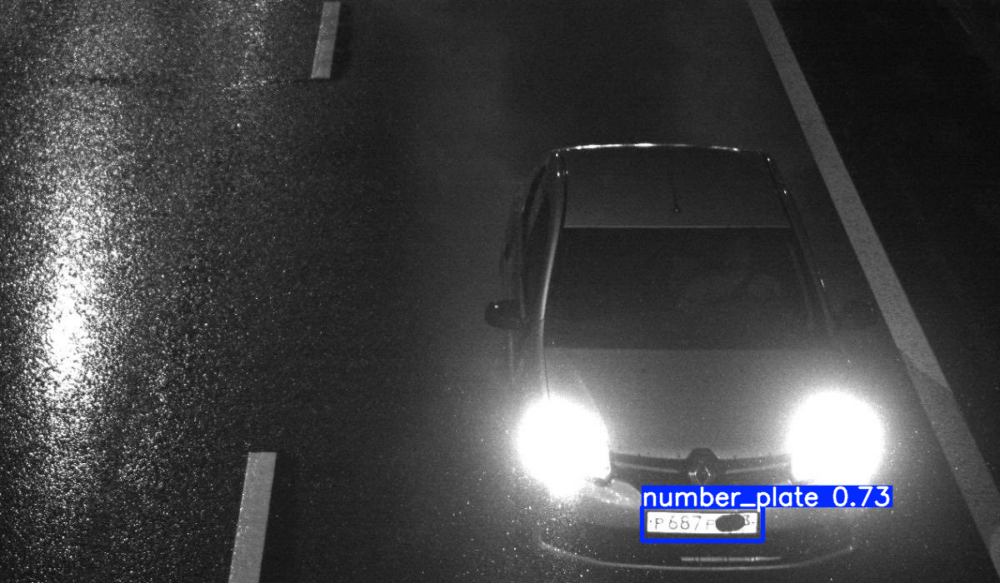


0: 384x640 1 number_plate, 210.9ms
Speed: 5.6ms preprocess, 210.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


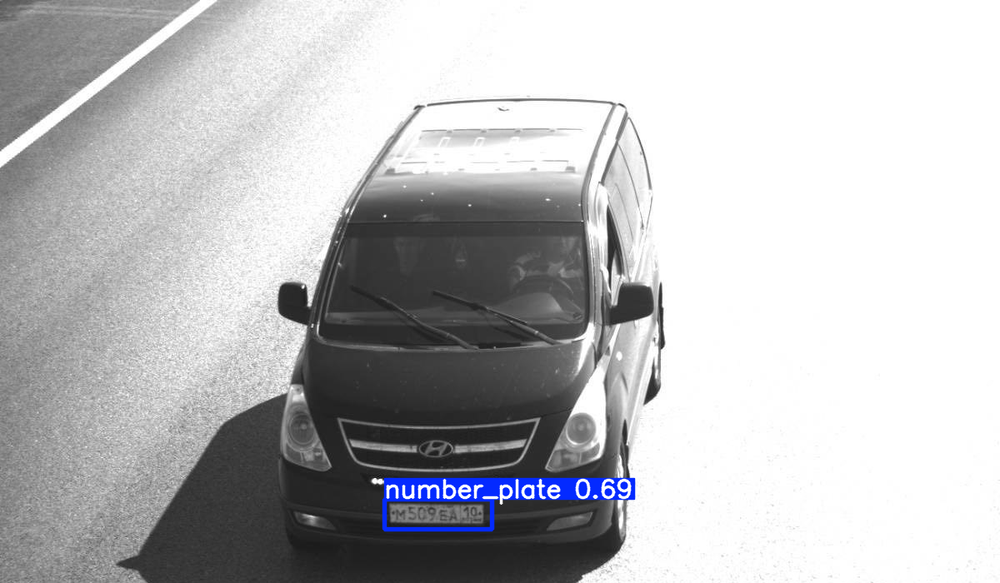


0: 384x640 1 number_plate, 268.3ms
Speed: 7.4ms preprocess, 268.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


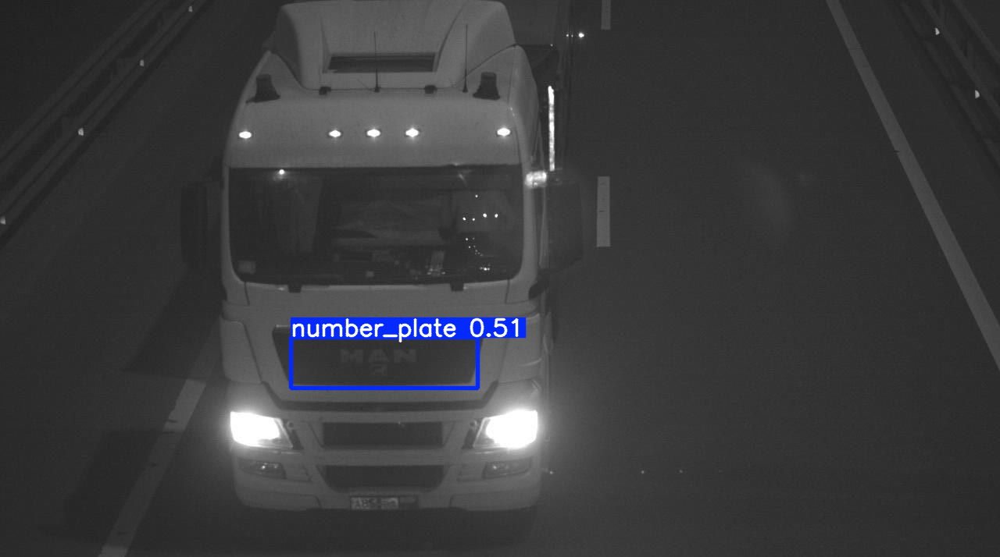


0: 384x640 1 number_plate, 230.4ms
Speed: 7.5ms preprocess, 230.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


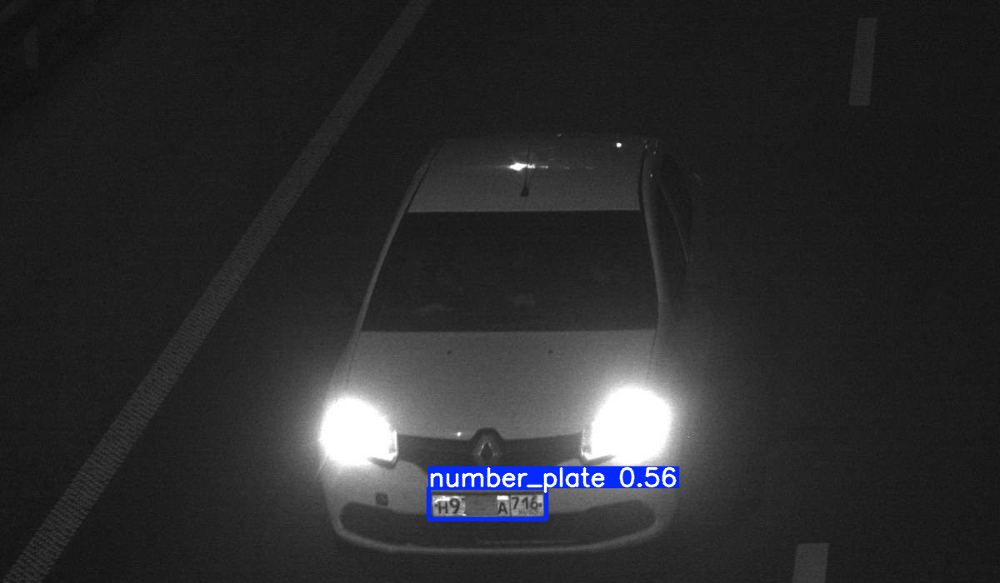


0: 384x640 1 number_plate, 229.2ms
Speed: 8.0ms preprocess, 229.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


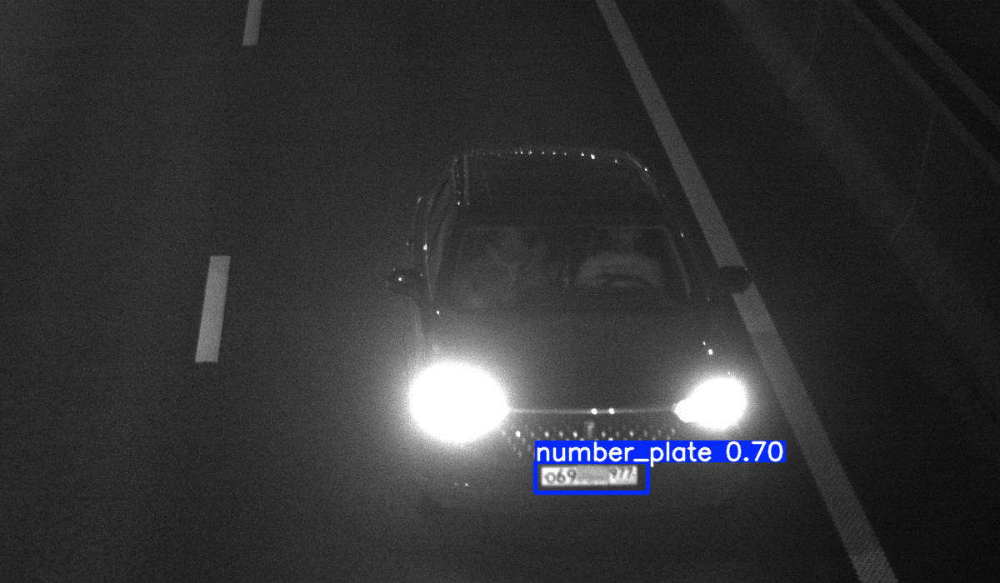


0: 384x640 1 number_plate, 262.9ms
Speed: 7.0ms preprocess, 262.9ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


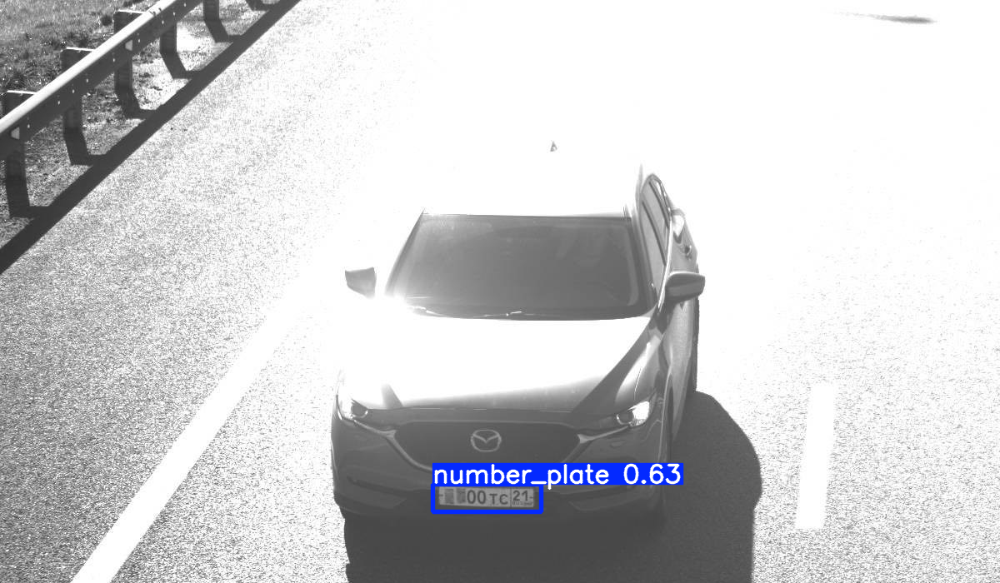

In [54]:
for i, img in enumerate(test_images):
    results = model.predict(img, conf=0.2)

    boxes = results[0].boxes

    if len(boxes) != 0:
        for j, box in enumerate(boxes):
            conf = box.conf.item()
            cls = int(box.cls.item())
            xyxy = box.xyxy[0].tolist()

    results[0].show()
